In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from tomlkit.toml_file import TOMLFile

plt.rcParams['figure.figsize'] = [8, 5.5]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower

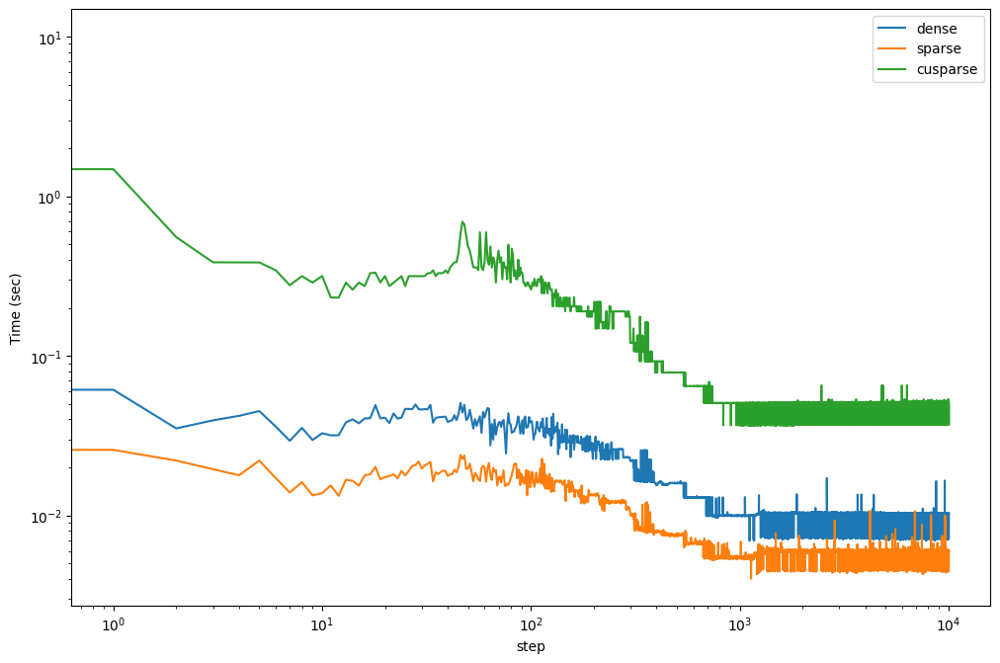

In [2]:
fig, ax = plt.subplots()
for idir, method in enumerate(['dense', 'sparse', 'cusparse']):
    timer = np.loadtxt(f"naunet_example{idir}x/build/test/time.txt")
    steps = range(len(timer))
    ax.plot(steps, timer, label=method)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('step')
ax.set_ylabel('Time (sec)')
ax.legend()

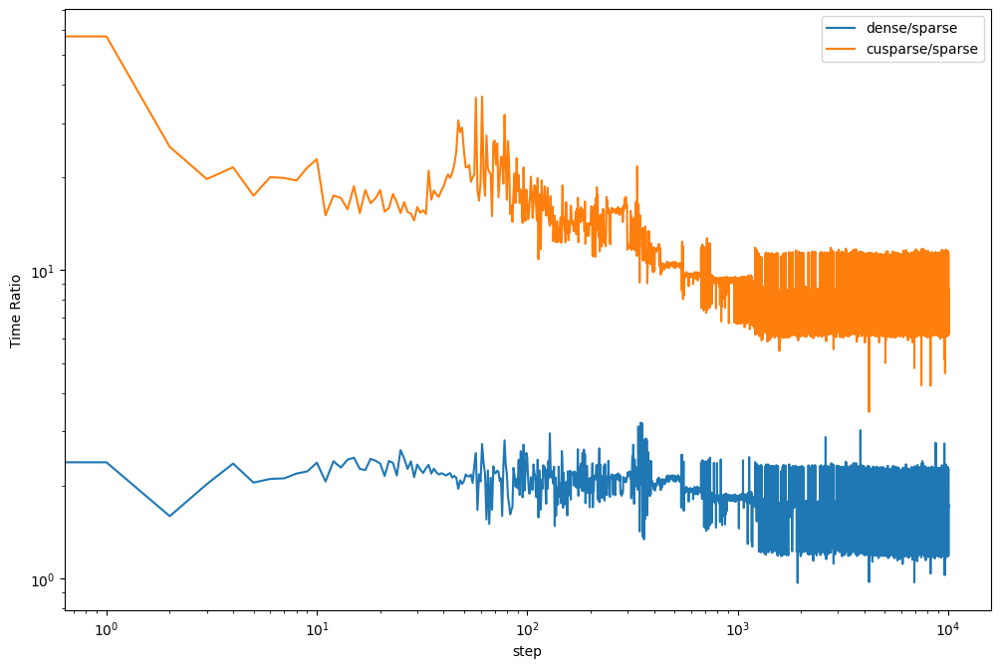

In [3]:
fig, ax = plt.subplots()
sparsetimer = np.loadtxt("naunet_example1x/build/test/time.txt")
for idir, method in zip([0, 2], ['dense', 'cusparse']):
    timer = np.loadtxt(f"naunet_example{idir}x/build/test/time.txt")
    steps = range(len(timer))
    ax.plot(steps, timer/sparsetimer, label=f"{method}/sparse")

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('step')
ax.set_ylabel('Time Ratio')
ax.legend()

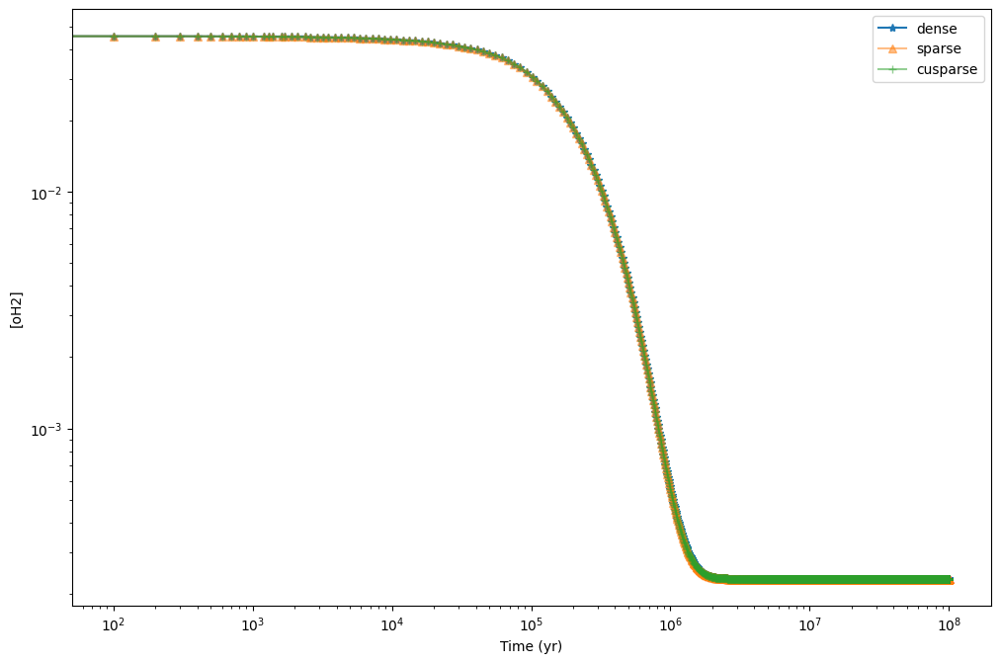

In [4]:
fig, ax = plt.subplots()
spec = "oH2"
markers = ["*", "^", "+"]
alphas = [1, 0.5, 0.5]
for idir, method in enumerate(['dense', 'sparse', 'cusparse']):
    config = TOMLFile(f"naunet_example{idir}x/naunet_config.toml")
    content = config.read()
    chemistry = content["chemistry"]
    species = chemistry["species"]
    # print(species)

    # txtdata = np.loadtxt(f'naunet_example{idir}/build/test/evolution.txt')
    bindata = np.fromfile(f'naunet_example{idir}x/build/test/evolution.bin',dtype='float64').reshape(-1,132)
    # print(txtdata.shape, bindata.shape)
    time = bindata[:,0]
    ax.plot(time, bindata[:,species.index(spec)+1]/1e5, label=method, marker=markers[idir], alpha=alphas[idir])

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Time (yr)')
ax.set_ylabel(f'[{spec}]')
ax.legend()

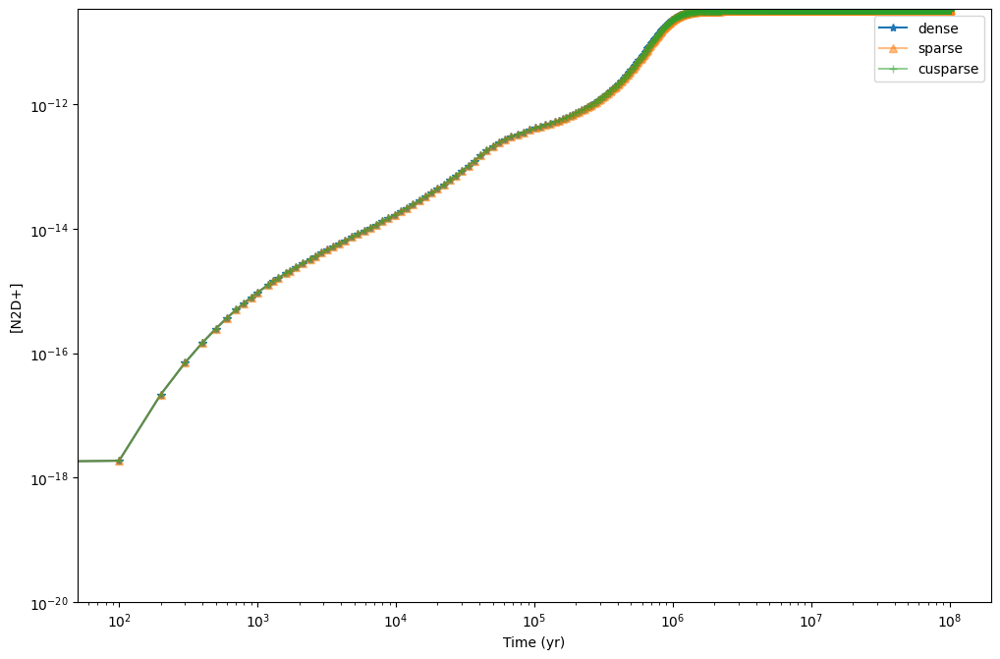

In [5]:
fig, ax = plt.subplots()
spec = "N2D+"
markers = ["*", "^", "+"]
alphas = [1, 0.5, 0.5]
for idir, method in enumerate(['dense', 'sparse', 'cusparse']):
    config = TOMLFile(f"naunet_example{idir}x/naunet_config.toml")
    content = config.read()
    chemistry = content["chemistry"]
    species = chemistry["species"]
    # print(species)

    # txtdata = np.loadtxt(f'naunet_example{idir}/build/test/evolution.txt')
    bindata = np.fromfile(f'naunet_example{idir}x/build/test/evolution.bin',dtype='float64').reshape(-1,132)
    # print(txtdata.shape, bindata.shape)
    time = bindata[:,0]
    ax.plot(time, bindata[:,species.index(spec)+1]/1e5, label=method, marker=markers[idir], alpha=alphas[idir])

ax.set_ylim(bottom=1e-20)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Time (yr)')
ax.set_ylabel(f'[{spec}]')
ax.legend()